<a href="https://colab.research.google.com/github/SohaibAShah/FCC_ML_Python/blob/main/cat_dog_Classifier_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
try:
  # This command only in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [10]:
# Get project files
!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip cats_and_dogs.zip

PATH = 'cats_and_dogs'

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')
test_dir = os.path.join(PATH, 'test')

# Get number of files in each directory. The train and validation directories
# each have the subdirecories "dogs" and "cats".
total_train = sum([len(files) for r, d, files in os.walk(train_dir)])
total_val = sum([len(files) for r, d, files in os.walk(validation_dir)])
total_test = len(os.listdir(test_dir))
print(total_train, total_val, total_test)
# Variables for pre-processing and training.
batch_size = 128
epochs = 15
IMG_HEIGHT = 150
IMG_WIDTH = 150

--2023-10-08 12:52:43--  https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip
Resolving cdn.freecodecamp.org (cdn.freecodecamp.org)... 104.26.2.33, 172.67.70.149, 104.26.3.33, ...
Connecting to cdn.freecodecamp.org (cdn.freecodecamp.org)|104.26.2.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70702765 (67M) [application/zip]
Saving to: ‘cats_and_dogs.zip.1’

cats_and_dogs.zip.1 100%[===================>]  67.43M   248MB/s    in 0.3s    

2023-10-08 12:52:44 (248 MB/s) - ‘cats_and_dogs.zip.1’ saved [70702765/70702765]

Archive:  cats_and_dogs.zip
replace cats_and_dogs/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
2001 1001 51


In [11]:
# 3
# Set up the data generator with desired augmentation and preprocessing options
train_image_generator = ImageDataGenerator(rescale=1./255)
validation_image_generator = ImageDataGenerator(rescale=1./255)
test_image_generator = ImageDataGenerator(rescale=1./255)
# Generate batches of augmented data
train_data_gen = train_image_generator.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=batch_size,
    class_mode='binary'
)

val_data_gen = validation_image_generator.flow_from_directory(
    validation_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=batch_size,
    class_mode='binary'
)

# Generate batches of test data
test_data_gen = test_image_generator.flow_from_directory(
    directory=PATH,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=batch_size,
    shuffle=False,
    classes=['test']
  )

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 50 images belonging to 1 classes.


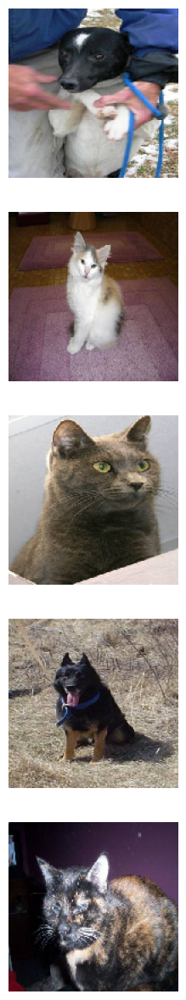

In [12]:
# 4
def plotImages(images_arr, probabilities = False):
    fig, axes = plt.subplots(len(images_arr), 1, figsize=(5,len(images_arr) * 3))
    if probabilities is False:
      for img, ax in zip( images_arr, axes):
          ax.imshow(img)
          ax.axis('off')
    else:
      for img, probability, ax in zip( images_arr, probabilities, axes):
          ax.imshow(img)
          ax.axis('off')
          if probability > 0.5:
              ax.set_title("%.2f" % (probability*100) + "% dog")
          else:
              ax.set_title("%.2f" % ((1-probability)*100) + "% cat")
    plt.show()

sample_training_images, _ = next(test_data_gen)
plotImages(sample_training_images[:5])


In [13]:
# 5
#train_image_generator = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2, height_shift_range=0.2)
train_image_generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip = True,
    zoom_range = 0.3,
    rotation_range = 15.,
    validation_split = 0.1,
    width_shift_range=0.2,
    height_shift_range=0.2
)

Found 2000 images belonging to 2 classes.


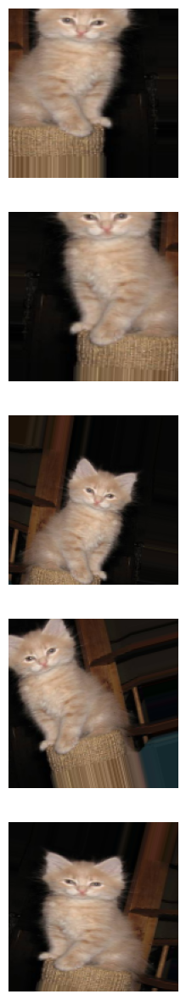

In [14]:
# 6
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

augmented_images = [train_data_gen[0][0][0] for i in range(5)]

plotImages(augmented_images)

In [22]:
# 7
model = Sequential()

# Add Convolutional and Pooling layers
model.add(Conv2D(32, 3,3, activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(MaxPooling2D(2))
model.add(Conv2D(64, 3,3, activation='relu'))
model.add(MaxPooling2D(2))
model.add(Conv2D(128, 3,3, activation='relu'))

# Flatten the output of the previous layer
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.Adamax(learning_rate=0.001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 50, 50, 32)        896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 25, 25, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 8, 8, 64)          18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 4, 4, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 1, 1, 128)         73856     
                                                                 
 flatten_3 (Flatten)         (None, 128)              

In [23]:
# 8
# Set the number of training and validation steps
train_steps = train_data_gen.n // train_data_gen.batch_size
val_steps = val_data_gen.n // val_data_gen.batch_size

# Train the model
history = model.fit(
    train_data_gen,
    validation_data = val_data_gen,
    epochs=epochs,
)

Epoch 1/15
16/16 [==============================] - 18s 941ms/step - loss: 0.6920 - accuracy: 0.5200 - val_loss: 0.6864 - val_accuracy: 0.5640
Epoch 2/15
16/16 [==============================] - 15s 968ms/step - loss: 0.6878 - accuracy: 0.5575 - val_loss: 0.6788 - val_accuracy: 0.5650
Epoch 3/15
16/16 [==============================] - 16s 1s/step - loss: 0.6808 - accuracy: 0.5885 - val_loss: 0.6713 - val_accuracy: 0.5570
Epoch 4/15
16/16 [==============================] - 17s 1s/step - loss: 0.6715 - accuracy: 0.5910 - val_loss: 0.6581 - val_accuracy: 0.5940
Epoch 5/15
16/16 [==============================] - 15s 961ms/step - loss: 0.6669 - accuracy: 0.5915 - val_loss: 0.6448 - val_accuracy: 0.6180
Epoch 6/15
16/16 [==============================] - 15s 991ms/step - loss: 0.6576 - accuracy: 0.6135 - val_loss: 0.6477 - val_accuracy: 0.6020
Epoch 7/15
16/16 [==============================] - 15s 984ms/step - loss: 0.6540 - accuracy: 0.6080 - val_loss: 0.6312 - val_accuracy: 0.6330
Epoch

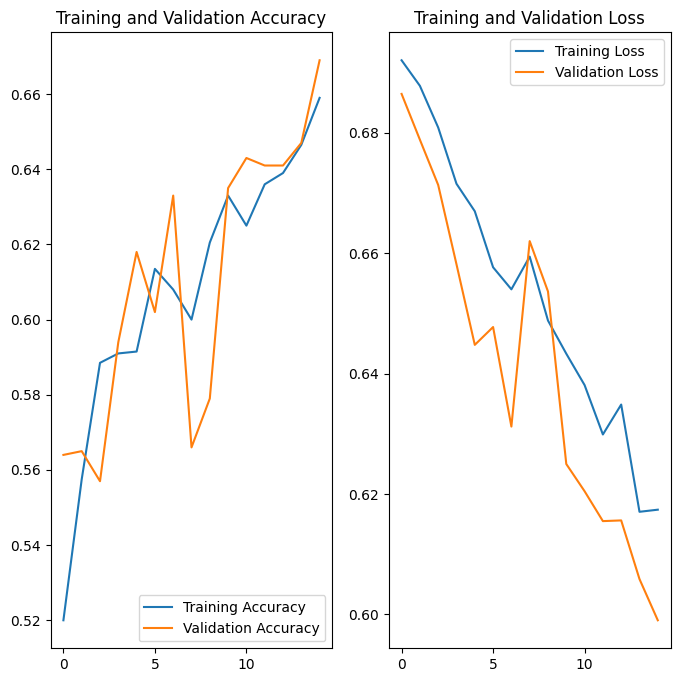

In [24]:
# 9
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 104ms/step


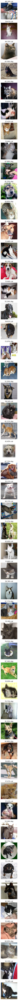

1/1 [==============================] - 0s 146ms/step


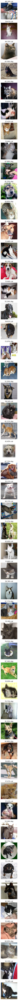

In [27]:
# Get the predicted probabilities for the test images
probabilities = model.predict(test_data_gen)

# Plot the test images with their probabilities
plotImages(test_data_gen[0][0], probabilities[:, 0])


In [28]:
# 11
answers =  [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
            1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
            1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
            1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
            0, 0, 0, 0, 0, 0]

correct = 0

for probability, answer in zip(probabilities[:, 0], answers):
  if np.round(probability) == answer:
    correct +=1

percentage_identified = (correct / len(answers)) * 100

passed_challenge = percentage_identified >= 63

print(f"Your model correctly identified {round(percentage_identified, 2)}% of the images of cats and dogs.")

if passed_challenge:
  print("You passed the challenge!")
else:
  print("You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!")

Your model correctly identified 68.0% of the images of cats and dogs.
You passed the challenge!
